In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import glob
import matplotlib.pyplot as plt
import seaborn as sns

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


# raw data

In [36]:
EW = gpd.read_file('./../../Volumes/Extreme_SSD/WORK/EPC/english_EPC/LSOA_data_raw.geojson')
ST = gpd.read_file('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_data_raw.geojson')

In [37]:
EW_res = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/census/2021/LSOA_N_residents.csv')
ST_res = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/census/datazones_N_residents.csv')

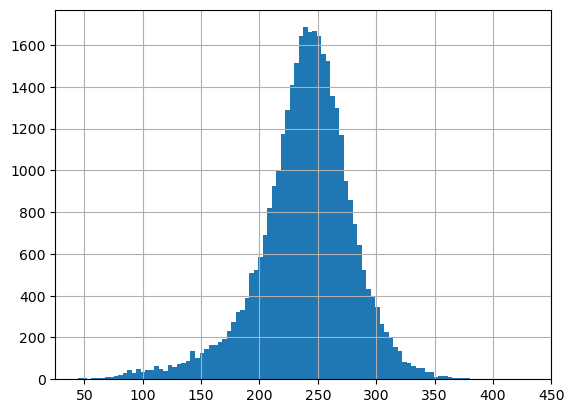

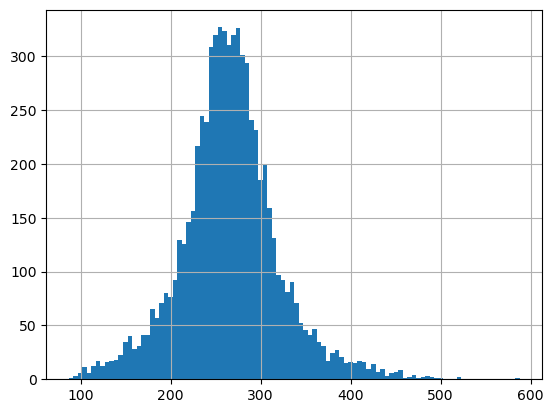

In [38]:
EW['ENERGY_CONSUMPTION_CURRENT_mean'].hist(
    bins = 100
)
plt.show()

ST['ENERGY_CONSUMPTION_CURRENT_mean'].hist(
    bins = 100
)
plt.show()

In [39]:
EW = EW.merge(EW_res, on = 'LSOA21CD', how = 'left')
ST = ST.merge(ST_res, on = 'DataZone', how = 'left')

In [42]:
ST['CROWDING'] = ST['TOTAL_FLOOR_AREA_mean']/ST['Total_residents']
EW['CROWDING'] = EW['TOTAL_FLOOR_AREA_mean']/EW['Total_residents']

## Adjust variables to match each other

In [43]:
EW['COUNTRY'] = 'England and Wales'
ST['COUNTRY'] = 'Scotland'

EW = EW.rename(columns = {'LSOA21CD':'AREA_ID', 'LSOA21NM':'AREA_NAME'})
ST = ST.rename(columns = {'DataZone':'AREA_ID', 'Name':'AREA_NAME'})

EW = EW.drop(columns=['GlobalID','OBJECTID'])

## combine

In [44]:
data = pd.concat([ST, EW])
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 42648 entries, 0 to 35671
Data columns (total 65 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   AREA_ID                                42648 non-null  object  
 1   AREA_NAME                              42648 non-null  object  
 2   MULTI_GLAZE_PROPORTION_median          42645 non-null  float64 
 3   MULTI_GLAZE_PROPORTION_mean            42645 non-null  float64 
 4   EXTENSION_COUNT_median                 42642 non-null  float64 
 5   EXTENSION_COUNT_mean                   42642 non-null  float64 
 6   PHOTO_SUPPLY_bi_sum                    42646 non-null  float64 
 7   Roof_insulati_sum                      42646 non-null  float64 
 8   Roof_thatch_sum                        42646 non-null  float64 
 9   NUMBER_OPEN_FIREPLACES_sum             42646 non-null  float64 
 10  NUMBER_OPEN_FIREPLACES_median          42646 non-null  

## out

In [45]:
data.to_file('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/EPC_data_raw.geojson')
pd.DataFrame(data).drop(columns = ['geometry']).to_csv('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/EPC_data_raw.csv')

# rated data

In [46]:
EW = gpd.read_file('./../../Volumes/Extreme_SSD/WORK/EPC/english_EPC/LSOA_data_rates.geojson')
ST = gpd.read_file('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_data_rates.geojson')

In [47]:
EW = EW.merge(EW_res, on = 'LSOA21CD', how = 'left')
ST = ST.merge(ST_res, on = 'DataZone', how = 'left')
ST['CROWDING'] = ST['TOTAL_FLOOR_AREA_mean']/ST['Total_residents']
EW['CROWDING'] = EW['TOTAL_FLOOR_AREA_mean']/EW['Total_residents']

In [49]:
EW['COUNTRY'] = 'England and Wales'
ST['COUNTRY'] = 'Scotland'

EW = EW.rename(columns = {'LSOA21CD':'AREA_ID', 'LSOA21NM':'AREA_NAME'})
ST = ST.rename(columns = {'DataZone':'AREA_ID', 'Name':'AREA_NAME'})

EW = EW.drop(columns=['GlobalID','OBJECTID'])

In [50]:
data = pd.concat([ST, EW])

In [59]:
data.columns

Index(['AREA_ID', 'AREA_NAME', 'MULTI_GLAZE_PROPORTION_median',
       'MULTI_GLAZE_PROPORTION_mean', 'EXTENSION_COUNT_median',
       'EXTENSION_COUNT_mean', 'PHOTO_SUPPLY_bi_sum', 'Roof_insulati_sum',
       'Roof_thatch_sum', 'NUMBER_OPEN_FIREPLACES_sum',
       'NUMBER_OPEN_FIREPLACES_median', 'NUMBER_OPEN_FIREPLACES_mean',
       'NUMBER_OPEN_FIREPLACES_binary_sum', 'MAIN_electric_sum',
       'MAIN_solid_fuel_sum', 'MAIN_other_sum', 'MAIN_electric_other_sum',
       'MAIN_electric_solid_sum', 'MAIN_solid_other_sum',
       'SECOND_electric_sum', 'SECOND_solid_fuel_sum', 'SECOND_other_sum',
       'SECOND_electric_other_sum', 'SECOND_electric_solid_sum',
       'SECOND_solid_other_sum', 'TOTAL_FLOOR_AREA_median',
       'TOTAL_FLOOR_AREA_mean', 'MAINS_GAS_FLAG_sum', 'count_epc',
       'Owner-occupied_sum', 'Rented (private)_sum', 'Rented (social)_sum',
       'Detached_sum', 'End-Terrace_sum', 'Mid-Terrace_sum',
       'Semi-Detached_sum', 'Bungalow_sum', 'Flat_sum', 'House_sum',

In [65]:
cols_plot = [ 'MULTI_GLAZE_PROPORTION_median',
       'MULTI_GLAZE_PROPORTION_mean', 'EXTENSION_COUNT_median',
       'EXTENSION_COUNT_mean', 'PHOTO_SUPPLY_bi_sum', 'Roof_insulati_sum',
       'Roof_thatch_sum', 'NUMBER_OPEN_FIREPLACES_sum',
       'NUMBER_OPEN_FIREPLACES_median', 'NUMBER_OPEN_FIREPLACES_mean',
       'NUMBER_OPEN_FIREPLACES_binary_sum', 'MAIN_electric_sum',
       'MAIN_solid_fuel_sum', 'MAIN_other_sum', 'MAIN_electric_other_sum',
       'MAIN_electric_solid_sum', 'MAIN_solid_other_sum',
       'SECOND_electric_sum', 'SECOND_solid_fuel_sum', 'SECOND_other_sum',
       'SECOND_electric_other_sum', 'SECOND_electric_solid_sum',
       'SECOND_solid_other_sum', 'TOTAL_FLOOR_AREA_median',
       'TOTAL_FLOOR_AREA_mean', 'MAINS_GAS_FLAG_sum', 'count_epc',
       'Owner-occupied_sum', 'Rented (private)_sum', 'Rented (social)_sum',
       'Detached_sum', 'End-Terrace_sum', 'Mid-Terrace_sum',
       'Semi-Detached_sum', 'Bungalow_sum', 'Flat_sum', 'House_sum',
       'Maisonette_sum', 'Park_home_sum', '1976-2002_sum', '1930-1949_sum',
       'before_1929_sum', '1950-1975_sum', '2003_onwards_sum',
       'CURRENT_ENERGY_EFFICIENCY_median', 'CURRENT_ENERGY_EFFICIENCY_mean',
       'CURRENT_ENERGY_RATING_numbered_median',
       'CURRENT_ENERGY_RATING_numbered_mean',
       'ENERGY_CONSUMPTION_CURRENT_median', 'ENERGY_CONSUMPTION_CURRENT_mean',
       'ENERGY_CONSUMPTION_POTENTIAL_median',
       'ENERGY_CONSUMPTION_POTENTIAL_mean', 'TOP_FLOOR_FLAT_sum',
       'TRANS_TYPE_other_sum', 'TRANS_TYPE_govdeal_sum',
       'Total: All households', 'PROP_EPC_FROM_CENSUS_HOUSE', 
       'Total_residents', 'CROWDING',  'PHOTO_SUPPLY_median',
       'PHOTO_SUPPLY_mean']

/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 1.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 3.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 1.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:

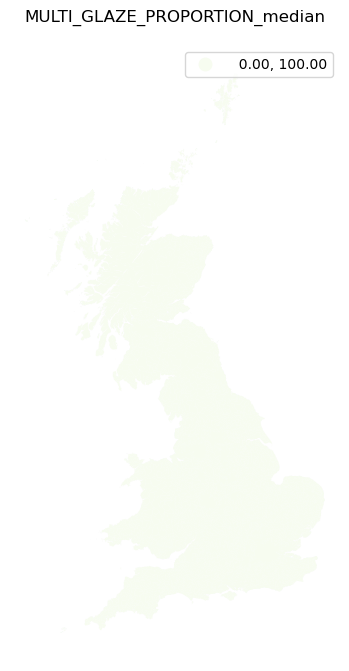

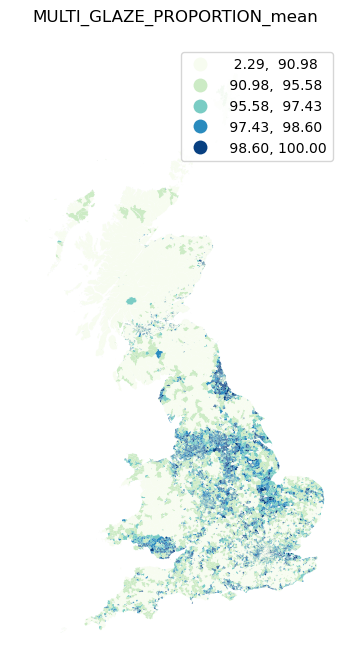

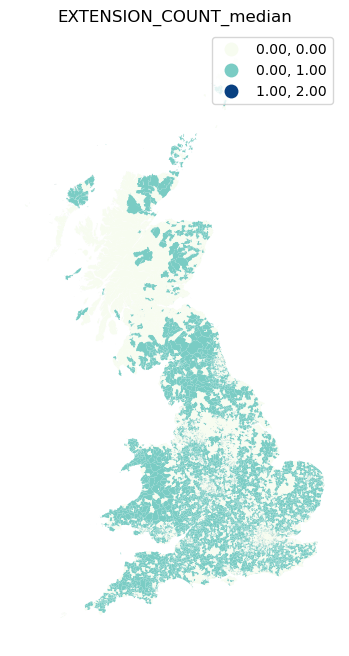

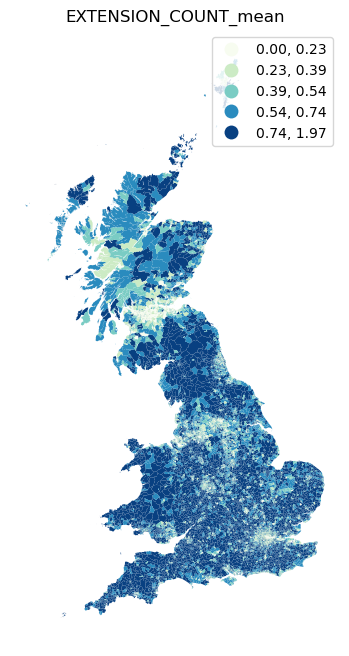

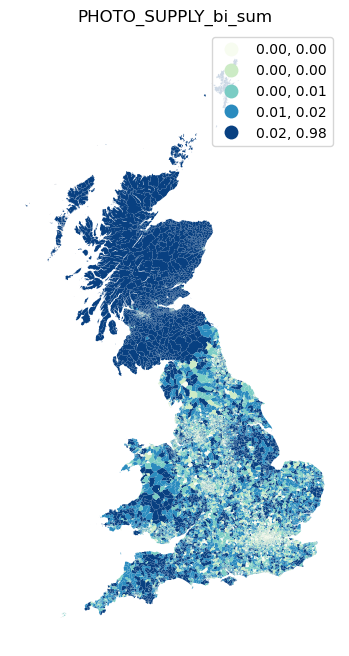

...

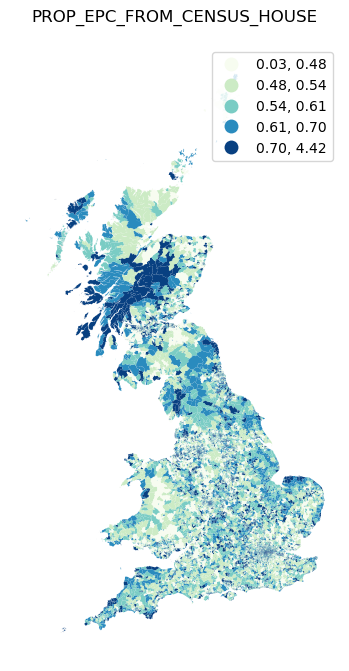

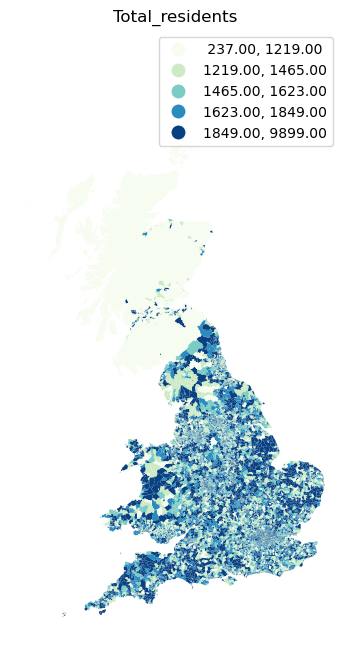

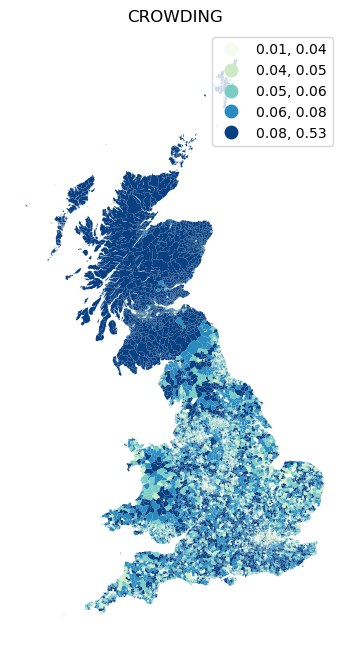

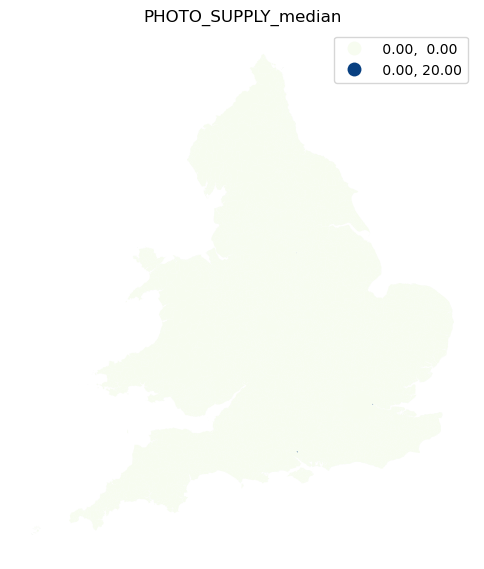

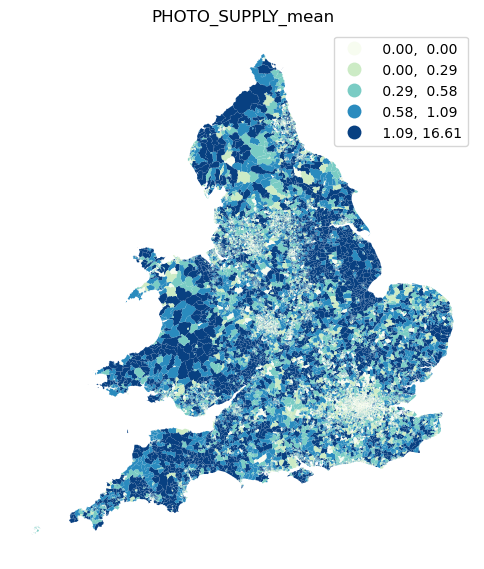

In [67]:
for i in cols_plot:
    ax = data.plot(column = i, legend = True, 
                                            cmap='GnBu',
                                            scheme="quantiles", k=5,
                                            figsize=(6, 8))
    ax.set_axis_off()
    plt.title(i)
    plt.savefig(str('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/figures/' + i +'.png'))

In [66]:
df = data.loc[:,cols_plot]
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None).to_excel('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/all_prop_corrs.xlsx')

In [58]:
data.to_file('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/EPC_data_rates.geojson')
pd.DataFrame(data).drop(columns = ['geometry']).to_csv('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/EPC_data_rates.csv')

In [71]:
# pd.DataFrame(data.loc[:,['AREA_ID','Total_residents', 'CROWDING']]).to_csv('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/crowding_EW_ST.csv')
crowd = data.loc[:,['AREA_ID','Total_residents', 'CROWDING']]

# Gas only 

In [72]:
EW = gpd.read_file('./../../Volumes/Extreme_SSD/WORK/EPC/english_EPC/GAS_LSOA_data_raw.geojson')
ST = gpd.read_file('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/GAS_DZ_data_raw.geojson')

In [73]:
EW['COUNTRY'] = 'England and Wales'
ST['COUNTRY'] = 'Scotland'

EW = EW.rename(columns = {'LSOA21CD':'AREA_ID', 'LSOA21NM':'AREA_NAME'})
ST = ST.rename(columns = {'DataZone':'AREA_ID', 'Name':'AREA_NAME'})

EW = EW.drop(columns=['GlobalID','OBJECTID'])

In [74]:
data = pd.concat([ST, EW])
data.merge(crowd, on = 'AREA_ID', how = 'left')
data.to_file('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/EPC_data_GAS_raw.geojson')
pd.DataFrame(data).drop(columns = ['geometry']).to_csv('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/EPC_data_GAS_raw.csv')

# gas only rated

In [75]:
EW = gpd.read_file('./../../Volumes/Extreme_SSD/WORK/EPC/english_EPC/GAS_LSOA_data_rates.geojson')
ST = gpd.read_file('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/GAS_DZ_data_rates.geojson')

In [76]:
EW['COUNTRY'] = 'England and Wales'
ST['COUNTRY'] = 'Scotland'

EW = EW.rename(columns = {'LSOA21CD':'AREA_ID', 'LSOA21NM':'AREA_NAME'})
ST = ST.rename(columns = {'DataZone':'AREA_ID', 'Name':'AREA_NAME'})

EW = EW.drop(columns=['GlobalID','OBJECTID'])

In [77]:
data = pd.concat([ST, EW])
data.merge(crowd, on = 'AREA_ID', how = 'left')
data.to_file('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/EPC_data_GAS_rates.geojson')
pd.DataFrame(data).drop(columns = ['geometry']).to_csv('./../../Volumes/Extreme_SSD/WORK/EPC/Outputs/EPC_data_GAS_rates.csv')